In [10]:
import pandas as pd
import numpy as np

# Load the dataset with the specified encoding
url = "C:/Users/deept/Downloads/globalterrorismdb_0718dist.csv"
df = pd.read_csv(url, encoding='latin1')  # You can also try 'iso-8859-1' or 'cp1252'

C:\Users\deept\AppData\Local\Temp\ipykernel_13924\1258681787.py:6: DtypeWarning: Columns (4,6,31,33,61,62,63,76,79,90,92,94,96,114,115,121) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(url, encoding='latin1')  # You can also try 'iso-8859-1' or 'cp1252'


In [7]:
# Display the first few rows of the dataset
print(df.head())

# Display information about the dataset
print(df.info())

# Display summary statistics of the dataset
print(df.describe())


        eventid  iyear  imonth  iday approxdate  extended resolution  country  \
0  197000000001   1970       7     2        NaN         0        NaN       58   
1  197000000002   1970       0     0        NaN         0        NaN      130   
2  197001000001   1970       1     0        NaN         0        NaN      160   
3  197001000002   1970       1     0        NaN         0        NaN       78   
4  197001000003   1970       1     0        NaN         0        NaN      101   

          country_txt  region  ... addnotes scite1 scite2  scite3  dbsource  \
0  Dominican Republic       2  ...      NaN    NaN    NaN     NaN      PGIS   
1              Mexico       1  ...      NaN    NaN    NaN     NaN      PGIS   
2         Philippines       5  ...      NaN    NaN    NaN     NaN      PGIS   
3              Greece       8  ...      NaN    NaN    NaN     NaN      PGIS   
4               Japan       4  ...      NaN    NaN    NaN     NaN      PGIS   

   INT_LOG  INT_IDEO INT_MISC INT_ANY 

In [9]:
df.ffill(inplace=True)

## Top 10 countries by number of Terrorist Attacks

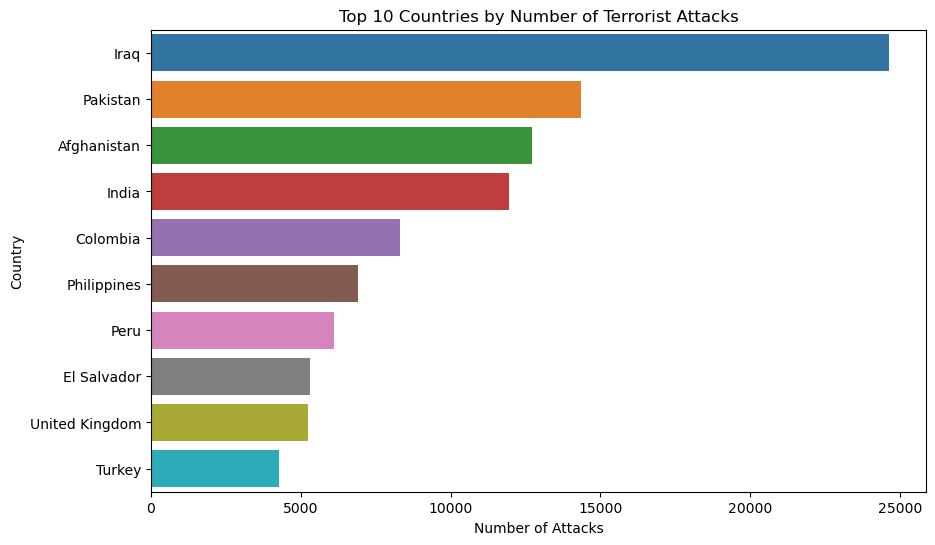

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10,6))
sns.countplot(y='country_txt', data=df, order=df['country_txt'].value_counts().index[:10])
plt.title('Top 10 Countries by Number of Terrorist Attacks')
plt.xlabel('Number of Attacks')
plt.ylabel('Country')
plt.show()


#### We can see that Iraq has faced the highest number of terrorist attacks, with a significant lead over the others.The following countries also show a high number of terrorist incidents:Pakistan,Afghanoistan,India,ColumbiaThere is a noticeable difference in the number of attacks between the top few countries and the rest, indicating that terrorism is more concentrated in certain areas.

## Trend Over Time

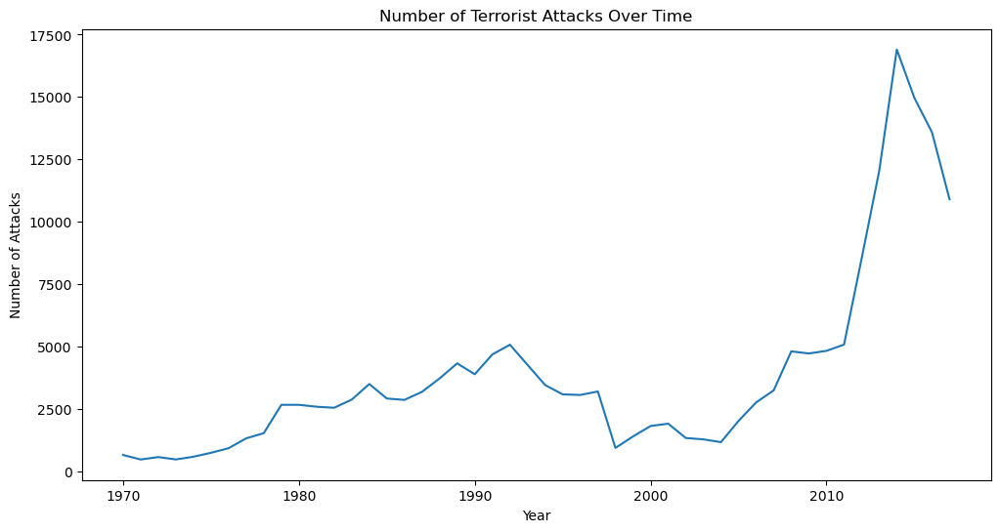

In [12]:
plt.figure(figsize=(12,6))
df['iyear'].value_counts().sort_index().plot(kind='line')
plt.title('Number of Terrorist Attacks Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Attacks')
plt.show()


#### One of the key analyses we performed was examining the trends in terrorist activities over time. As you can see from this line chart, the number of terrorist attacks has fluctuated significantly over the years. Notably, we observed spikes in certain periods, which may correlate with specific geopolitical events or conflicts.

## Hot Zone Analysis

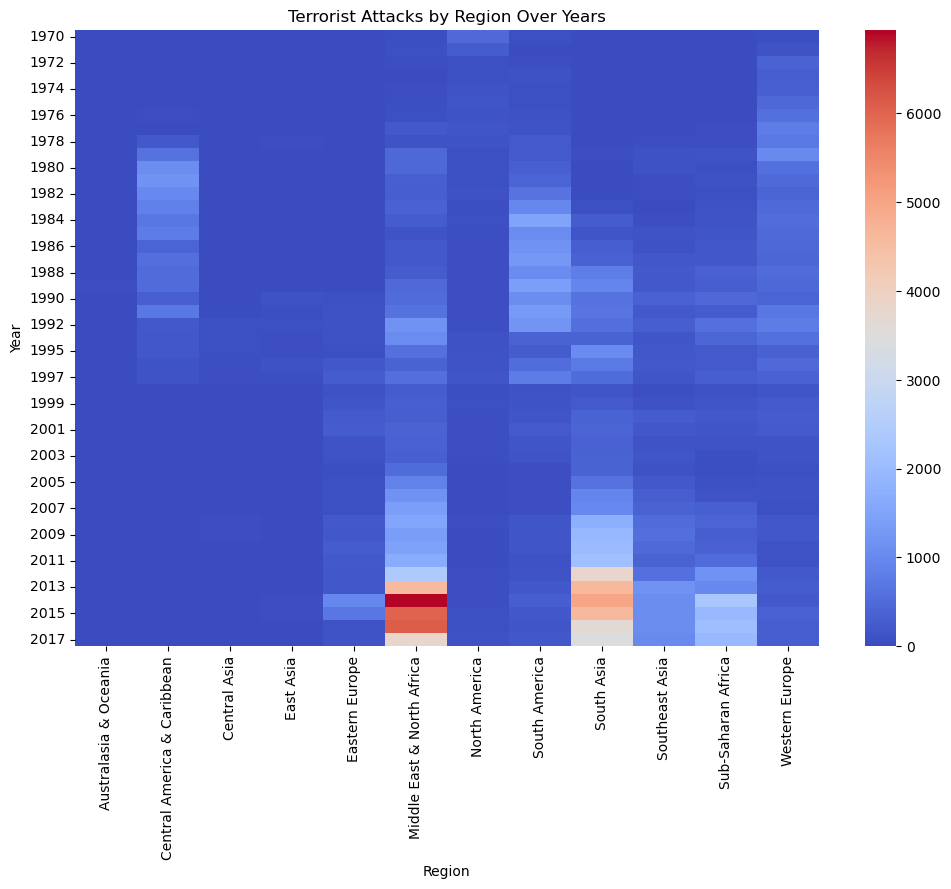

In [13]:
plt.figure(figsize=(12,8))
sns.heatmap(df.pivot_table(index='iyear', columns='region_txt', values='eventid', aggfunc='count', fill_value=0), cmap='coolwarm')
plt.title('Terrorist Attacks by Region Over Years')
plt.xlabel('Region')
plt.ylabel('Year')
plt.show()


#### From this heatmap, we can observe several important patterns:
#### 1) Certain regions like the Middle East & North Africa and South Asia have consistently high levels of terrorist activity over the years, indicated by the warmer colors.
#### 2)Some regions, such as North America and Western Europe, show relatively fewer attacks, with predominantly cooler colors.
#### 3)There are specific years where attacks spike in certain regions, which may correlate with significant geopolitical events or conflicts.

## Types of Terrorist Attacks

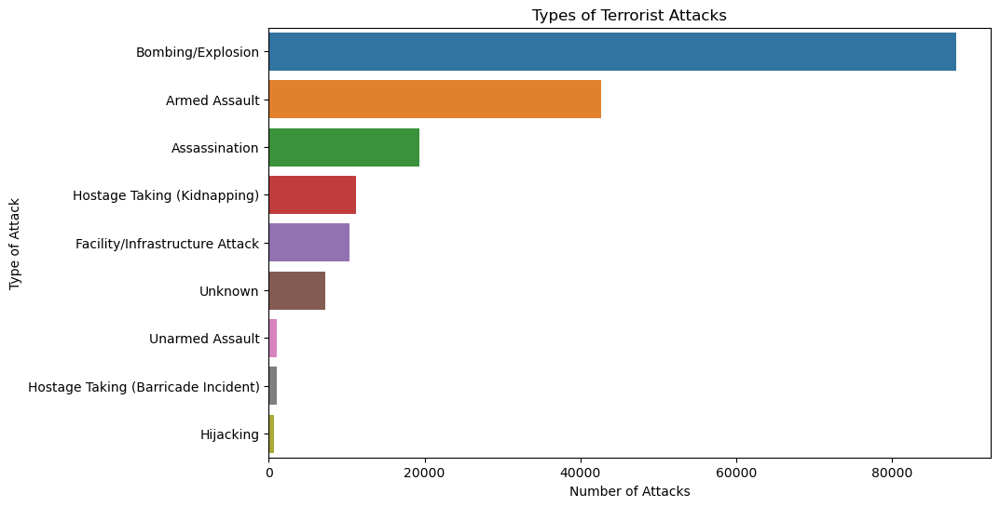

In [14]:
plt.figure(figsize=(10,6))
sns.countplot(y='attacktype1_txt', data=df, order=df['attacktype1_txt'].value_counts().index)
plt.title('Types of Terrorist Attacks')
plt.xlabel('Number of Attacks')
plt.ylabel('Type of Attack')
plt.show()


#### We also looked into the different types of terrorist attacks. This bar chart shows the prevalence of various attack types. Bombings and explosions are the most common, followed by armed assaults. Each type of attack requires different preventive measures and response strategies.

C:\Users\deept\AppData\Local\Temp\ipykernel_13924\1650266431.py:6: DtypeWarning:

Columns (4,6,31,33,61,62,63,76,79,90,92,94,96,114,115,121) have mixed types. Specify dtype option on import or set low_memory=False.



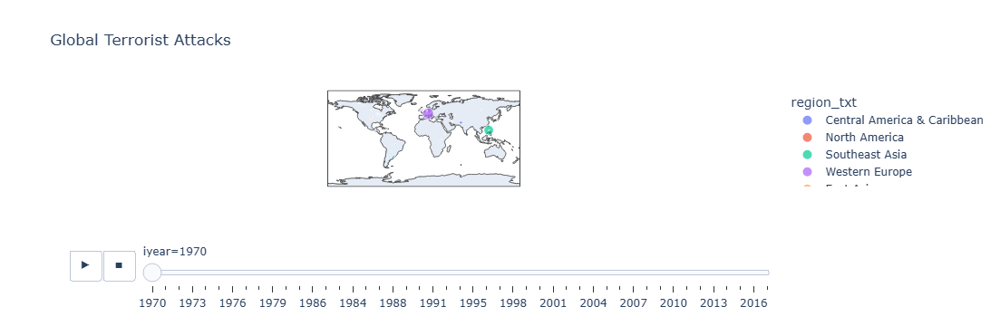

In [17]:
import pandas as pd
import plotly.express as px

# Load the dataset with the specified encoding
url = "C:/Users/deept/Downloads/globalterrorismdb_0718dist.csv"
df = pd.read_csv(url, encoding='latin1')  # You can also try 'iso-8859-1' or 'cp1252'

# Fill missing values using forward fill method
df.ffill(inplace=True)

# Handle NaN values in the 'nkill' column by filling them with 0
df['nkill'].fillna(0, inplace=True)

# Optionally scale the 'nkill' values to make the sizes more noticeable
df['nkill_scaled'] = df['nkill'] * 10  # Adjust the scaling factor as needed

# Example interactive map with larger sizes
fig = px.scatter_geo(df, locations="country_txt", locationmode='country names',
                     color="region_txt", hover_name="city", size="nkill_scaled",
                     animation_frame="iyear", title='Global Terrorist Attacks', size_max=50)  # Adjust size_max as needed
fig.show()


### Hot Zones:
##### We can clearly see hot zones of terrorist activities in regions like the Middle East, South Asia, and parts of Africa. These regions consistently show larger and more frequent points, indicating higher levels of terrorist activity.

### Temporal Trends:
##### The animation reveals how certain periods have spikes in terrorist activities. For instance, the early 2000s and the mid-2010s show significant increases in attacks, correlating with specific geopolitical events.

### Impact of Major Events:
##### We can correlate major geopolitical events, such as the Iraq War and the rise of ISIS, with increased terrorist activities in specific regions. This temporal aspect helps us understand the impact of these events.

## Conclusion
### In summary, this interactive map not only provides a visual representation of global terrorism but also offers deep insights into the geographic and temporal patterns of terrorist activities. By leveraging this data, we can enhance our strategies for counter-terrorism efforts and better protect vulnerable regions and population.